# Visualize results of 20241116 NCD aster analysis
`{aduarte,gsalmon}@caltech.edu`

In [5]:
## IMPORTS
import pandas as pd
import numpy as np
import h5py
import glob

######### gabe hacky styling to emulate some of PBoC Phillips lab style conventions, however hacky. tries to make easier for nigel++
## Styling
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context("poster")
# sns.set_style('ticks')

import matplotlib.colors as c
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Set the property to save figures with text as text, not paths
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# default good PBoC colors
baseBlendColor=(224/255, 219/255, 209/255,1) # default background for plots
contrastColor=(209/255, 193/255, 171/255,1) # slightly darker tan for contrasts, e.g. in inset boxes
yellowTanHighlightBoxColor='#FEF0C6'
goodGreyGreenArrowColor='#CCD4C9'

### Griffin style invocation

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.offsetbox import AnchoredText

def plotting_style(grid=False):
    """
    Sets the style to the publication style. To instantiate, simply call
    plotting_style() at the beginning of your script or notebook to force
    all matplotlib plots to adopt the scheme.

    Parameters
    ----------
    grid: bool
      If True, plots will have a thin, white grid in the background. Default
      is False.

    Returns
    -------
    colors: dict
      Returns a dictionary of the standard PBoC 2e color palette.
    """
    rc = {'axes.facecolor': '#E3DCD0',
#               'axes.spines.top': False,
#               'axes.spines.right': False,
#               'axes.spines.left': False,  # Ensure left spine is present
#               'axes.spines.bottom': False,  # Ensure bottom spine is present
#               'axes.spines.left': False, #{'color': '#E3DCD0', 'linewidth': 1.5},  # Set the spine color to the background color
#               'axes.spines.bottom': False, #{'color': '#E3DCD0', 'linewidth': 1.5},  # Set the spine color to the background color
          #'font.family': '/usr/share/fonts/truetype/LucidaSansOT.otf', #'LucidaSansOT.otf',
          'grid.linestyle': '-',
          'grid.linewidth': 0.5,
          'grid.alpha': 0.75,
          'grid.color': '#ffffff',
          'axes.grid': grid,
          'ytick.direction': 'in',
          'xtick.direction': 'in',
          'xtick.gridOn': grid,
          'ytick.gridOn': grid,
#               'ytick.major.width':8,
#               'xtick.major.width':8,
#               'ytick.major.size': 8,
#               'xtick.major.size': 8,
          'mathtext.fontset': 'stixsans',
          'mathtext.sf': 'sans',
          'legend.frameon': True,
          'legend.facecolor': '#FFEDCE',
          'figure.dpi': 150,
          'xtick.color': 'k',
          'ytick.color': 'k'
         }
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('mathtext', fontset='stixsans', sf='sans')
    sns.set_style('darkgrid', rc=rc)
    return color_palette()

def color_palette():
    """
    Returns a dictionary of the PBOC color palette
    """
    return {'green': '#7AA974', 'light_green': '#BFD598',
              'pale_green': '#DCECCB', 'yellow': '#EAC264',
              'light_yellow': '#F3DAA9', 'pale_yellow': '#FFEDCE',
              'blue': '#738FC1', 'light_blue': '#A9BFE3',
              'pale_blue': '#C9D7EE', 'red': '#D56C55', 'light_red': '#E8B19D',
              'pale_red': '#F1D4C9', 'purple': '#AB85AC',
              'light_purple': '#D4C2D9', 'dark_green':'#7E9D90', 'dark_brown':'#905426'}

def titlebox(
    ax, text, color, bgcolor=None, size=8, boxsize=0.1, pad=0.05, **kwargs
):
    """
    Sets a colored title box above the plot, spanning the entire plot width.

    Parameters
    ----------
    ax : matplotlib axis object
      The axis on which you want to add the titlebox.
    text: str
      The title tect
    bgcolor: str or None
      The background color of the title box. Default is no color (blank).
    size:  int
      Size of the text font
    boxsize: float [0, 1]
      Fraction of the total plot height to be occupied by the box. Default is 10% (0.1).
    pad: float
      The padding space between the title box and the top of the plot.

    """
    boxsize=str(boxsize * 100)  + '%'
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("top", size=boxsize, pad=pad)
    cax.get_xaxis().set_visible(False)
    cax.get_yaxis().set_visible(False)
    cax.spines["top"].set_visible(False)
    cax.spines["right"].set_visible(False)
#     cax.spines["bottom"].set_visible(False)
#     cax.spines["left"].set_visible(False)

#     cax.spines["bottom"].set_visible(True)
#     cax.spines["left"].set_visible(True)
#     cax.spines["left"].set_color("white")
#     cax.spines["bottom"].set_color("white")
#     cax.spines["bottom"].set_color("white")

#     cax.set_ticks_position('both')  # Adding ticks to both top and bottom
#     cax.yaxis.set_tick_params(direction='in', which='both', color='white')  # The bottom will maintain the default of 'out'


    plt.setp(cax.spines.values(), color=color)
    if bgcolor != None:
        cax.set_facecolor(bgcolor)
    else:
        cax.set_facecolor("white")
    at = AnchoredText(text, loc=10, frameon=False, prop=dict(size=size, color=color))
    cax.add_artist(at)


### Now actually call it
plotting_style()

import matplotlib.patheffects as pe
matplotlib.rcParams['axes.autolimit_mode'] = 'data'

## Analysis-specific visualization
20241116
* [NCD dimers] (one of 0.375uM ,...)
* date (one of 12-07-2023, 12-11-2023, 12-12-2023)
* Pos (one of 0, 1, 2)

#### An analyzed_data gname directory (each position=repeat in a date) will have these fields:
'all_rATPavgs.h5', 'all_rATPbins.h5', 'all_rMotavgs.h5', 'all_rMotbins.h5', 
'timesATP.h5', 'timesMot.h5', 'mot_centCrop.h5', 'ATP_centCrop.h5', 
'imshape.h5', 'mask_coords.h5', 'mot.h5', 'ATP.h5'

In [6]:
# Place where the metadata file is found
metaDataFile='../../data/aster/20241114_footageComments_gnames.csv'
metaDF = pd.read_csv(metaDataFile)

# ## Includes
goodSubset=metaDF[metaDF['Note'].apply(lambda x: 'GOOD' in x)]#[np.isin(metaDF['Note'], "GOOD")]
gnameList=list('../../data/aster/'+goodSubset['child']+'/'+goodSubset['FILE']+'/'+goodSubset['Position'])

In [3]:
# def summarizeGname(gname,motName='_NCD_dimers_'):
#     date=gname.split('Ncd_Aster_assay_')[-1].split('/')[0]
#     position=gname.split('/')[-1].split('_Pos')[-1].split('.ome.tif')[0]
#     #motConc=gname.split(motName)[0].split('_')[-1]
#     motConc=gname.upper().split(motName.upper())[0].split('_')[-1] # THIS PRESERVES UNITS
#     motConcUM=float(motConc.strip('UM'))
#     atpConc=gname.split('ATP')[0].split('_')[-1]
#     return date+'_Pos'+position, motConcUM, atpConc

In [5]:
# allProps=np.array([summarizeGname(gname) for gname in gnameList])
# allProps

In [7]:
umperpixel = 0.59 #um # QUESTION for ANA: should this be 0.59/2?? 

In [8]:
def read_h5py(path_name, excludes=[]):
    # Glob for directory parsing to get all .h5 files in the specified path
    h5files = glob.glob(path_name + '/*.h5')
    for excl in excludes:
        h5files=[file for file in h5files if excl not in file]
        
    #print("HDF5 files found:", h5files)
    
    # Dictionary to store arrays from each file
    all_data = {}
    
    for file in h5files:
        file_data = []  # List to hold datasets for the current file
        
        with h5py.File(file, 'r') as h5file:
            def load_data(name, obj):
                if isinstance(obj, h5py.Dataset):
                    file_data.append(obj[:])  # Append dataset as a NumPy array
            
            # Visit all datasets in the file and load them into file_data
            h5file.visititems(load_data)
        
        #slice by 8 since the date has 8 didgits
        field_name = file.split('.h5')[0].split('tif')[-1][15:] #BRO, 15 is the number of digits in how we save datetime -> 20241114_201131 (formerly we had 8 since we didnt include time)
        #print(file + '\n')
        #print(field_name+ '\n')
            
        # Add this file's data to all_data with the filename as the key
        all_data[field_name] = file_data[0]
        
        
    return all_data

In [9]:
# ### ATP - HACKish but whatever
# uniqueConcs=np.unique(allProps[:,1])
# uniqueRepeats=np.unique(allProps[:,0])

# ### ATP
# fig, axs = plt.subplots(nrows=len(uniqueConcs), 
#                         ncols=len(uniqueRepeats),
#                         figsize=(32,20))
# for g in range(len(gnameList)):
#     thisConcIdx=np.where(uniqueConcs==allProps[g, 1])[0][0]
    
#     #thisSubplIdx=(np.where(uniqueConcs==allProps[g, 1])[0][0], np.where(uniqueRepeats==allProps[g, 0])[0][0])
#     axs[thisSubplIdx].set_title(allProps[g,0], fontsize=14, color='grey')#gnameList[g].split('/')[-1], fontsize=10)

#     ## get this gname's analyzed data files & parse
#     #axs[thisSubplIdx].plot(1,1, 'ro')
#     h5spath=gnameList[g].split('data')[0]+'analyzed_data'+gnameList[g].split('data')[1]+'/'
#     h5dic = read_h5py(h5spath)

#     # this is (numTimes, numRbinMidpoints)
#     rATPmids=h5dic['all_rATPbins']*umperpixel
#     rATPavgs=h5dic['all_rATPavgs']
#     for time in range(rATPmids.shape[0]):
#         axs[thisSubplIdx].plot(rATPmids[time,:],
#                                rATPavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
#                                color=sns.color_palette("flare", as_cmap=True)(time/rATPmids.shape[0]), lw=2)
    
    
    
# # # Add y-labels to the first subplot in each row
# # row_labels = [r'$'+c+' \mu$'+'M NCD' for c in uniqueConcs]
# # for ax, label in zip(axs[:, 0], row_labels):  # Iterate over rows
# #     ax.set_ylabel(label)

# # Add flush-left y-labels using fig.text()
# row_labels = [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# for row_idx, label in enumerate(row_labels):
#     fig.text(
#         -0.01,  # X position (adjust for horizontal alignment)
#         1 - (row_idx + 0.5) / len(uniqueConcs),  # Y position centered for each row
#         label,
#         ha='left',  
#         va='center', 
#         rotation=90
#     )
    
# # Iterate through all subplots to hide empty ones
# for ax in axs.flat:  # .flat iterates over all subplots in the grid
#     if not ax.has_data():  # Check if the subplot has any data
#         ax.set_visible(False)  # Hide the entire axis

# # Adjust layout and display the plot
# plt.tight_layout()

# plt.savefig('20241116_initialMultipleAster_smlMltpls_ATP.pdf', bbox_inches='tight')

In [9]:
# ### MOTORS - hackish but whatever
# uniqueConcs=np.unique(allProps[:,1])
# uniqueRepeats=np.unique(allProps[:,0])

# ### MOTORS
# fig, axs = plt.subplots(nrows=len(uniqueConcs), 
#                         ncols=len(uniqueRepeats),
#                         figsize=(32,20))
# for g in range(len(gnameList)):
#     thisSubplIdx=(np.where(uniqueConcs==allProps[g, 1])[0][0], np.where(uniqueRepeats==allProps[g, 0])[0][0])
#     axs[thisSubplIdx].set_title(allProps[g,0], fontsize=14, color='grey')#gnameList[g].split('/')[-1], fontsize=10)

#     ## get this gname's analyzed data files & parse
#     #axs[thisSubplIdx].plot(1,1, 'ro')
#     h5spath=gnameList[g].split('data')[0]+'analyzed_data'+gnameList[g].split('data')[1]+'/'
#     h5dic = read_h5py(h5spath)

#     # this is (numTimes, numRbinMidpoints)
#     rMotmids=h5dic['all_rMotbins']*umperpixel
#     rMotavgs=h5dic['all_rMotavgs']
#     for time in range(rMotmids.shape[0]):
#         axs[thisSubplIdx].plot(rMotmids[time,:],
#                                rMotavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
#                                color=sns.color_palette("flare", as_cmap=True)(time/rMotmids.shape[0]), lw=2)
    
    
    
# # # Add y-labels to the first subplot in each row
# # row_labels = [r'$'+c+' \mu$'+'M NCD' for c in uniqueConcs]
# # for ax, label in zip(axs[:, 0], row_labels):  # Iterate over rows
# #     ax.set_ylabel(label)

# # Add flush-left y-labels using fig.text()
# row_labels = [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# for row_idx, label in enumerate(row_labels):
#     fig.text(
#         -0.01,  # X position (adjust for horizontal alignment)
#         1 - (row_idx + 0.5) / len(uniqueConcs),  # Y position centered for each row
#         label,
#         ha='left',  
#         va='center', 
#         rotation=90
#     )
    
# # Iterate through all subplots to hide empty ones
# for ax in axs.flat:  # .flat iterates over all subplots in the grid
#     if not ax.has_data():  # Check if the subplot has any data
#         ax.set_visible(False)  # Hide the entire axis

# # Adjust layout and display the plot
# plt.tight_layout()

# plt.savefig('20241116_initialMultipleAster_smlMltpls_Motors.pdf', bbox_inches='tight')

#### CORRECTED
* RESORT the gnameList first by date, then by repeat, then by position

In [11]:
def summarizeGnameVerbose(gname,motName='_NCD_dimers_'):
    date=gname.split('Ncd_Aster_assay_')[-1].split('/')[0]
    repNum=gname.split('MMStack')[0].split('_')[-2]
    position=gname.split('/')[-1].split('_Pos')[-1].split('.ome.tif')[0]
    #motConc=gname.split(motName)[0].split('_')[-1]
    motConc=gname.upper().split(motName.upper())[0].split('_')[-1] # THIS PRESERVES UNITS
    motConcUM=float(motConc.strip('UM'))
    atpConc=gname.split('ATP')[0].split('_')[-1]
    return date+'_r'+repNum+'_Pos'+position, motConcUM, atpConc

In [12]:
allProps_verb=np.array([summarizeGnameVerbose(gname) for gname in gnameList])
allProps_verb

array([['12-12-2023_r3_Pos0', '0.2', '500uM'],
       ['12-12-2023_r3_Pos1', '0.2', '500uM'],
       ['12-12-2023_r3_Pos2', '0.2', '500uM'],
       ['12-12-2023_r2_Pos0', '0.3', '500uM'],
       ['12-12-2023_r2_Pos1', '0.3', '500uM'],
       ['12-12-2023_r2_Pos2', '0.3', '500uM'],
       ['12-12-2023_r1_Pos0', '0.6', '500uM'],
       ['12-12-2023_r1_Pos1', '0.6', '500uM'],
       ['12-12-2023_r1_Pos2', '0.6', '500uM'],
       ['12-12-2023_r2_Pos0', '0.6', '500uM'],
       ['12-12-2023_r2_Pos1', '0.6', '500uM'],
       ['12-12-2023_r2_Pos2', '0.6', '500uM'],
       ['12-07-2023_r1_Pos0', '0.2', '500uM'],
       ['12-07-2023_r1_Pos1', '0.2', '500uM'],
       ['12-07-2023_r1_Pos2', '0.2', '500uM'],
       ['12-07-2023_r1_Pos0', '0.3', '500uM'],
       ['12-07-2023_r1_Pos1', '0.3', '500uM'],
       ['12-07-2023_r1_Pos2', '0.3', '500uM'],
       ['12-07-2023_r1_Pos0', '0.5', '500uM'],
       ['12-07-2023_r1_Pos1', '0.5', '500uM'],
       ['12-07-2023_r1_Pos2', '0.5', '500uM'],
       ['12-0

In [13]:
np.sum(allProps_verb[:,1]=='0.6')

np.int64(15)

In [14]:
# Find reordering based on trivial string ascending
reorderedIdxs=np.argsort(allProps_verb[:,0])
allProps_verb=allProps_verb[reorderedIdxs,:] # reorder properties
gnameList=np.array(gnameList)[reorderedIdxs]# ALSO reorder gnameList itself

In [16]:
### ITERATE over concentrations (first) instead of iterating over data files and placing them in deterministic spots
uniqueConcs=np.unique(allProps_verb[:,1])
for ii in range(len(uniqueConcs)):
    c=uniqueConcs[ii]
    #for every repeat that matches, in sorted order:
    idxsForThisC=np.where(allProps_verb[:,1]==c)[0]
    print(len(idxsForThisC))

6
6
6
3
15
6


An acceptable compromise for this uneven distribution of repeats versus concentration in a single subplot grid is to plot every concentration's repeats as one row of up to six, except for 0.6uM which will have two rows of six plus one row of three.

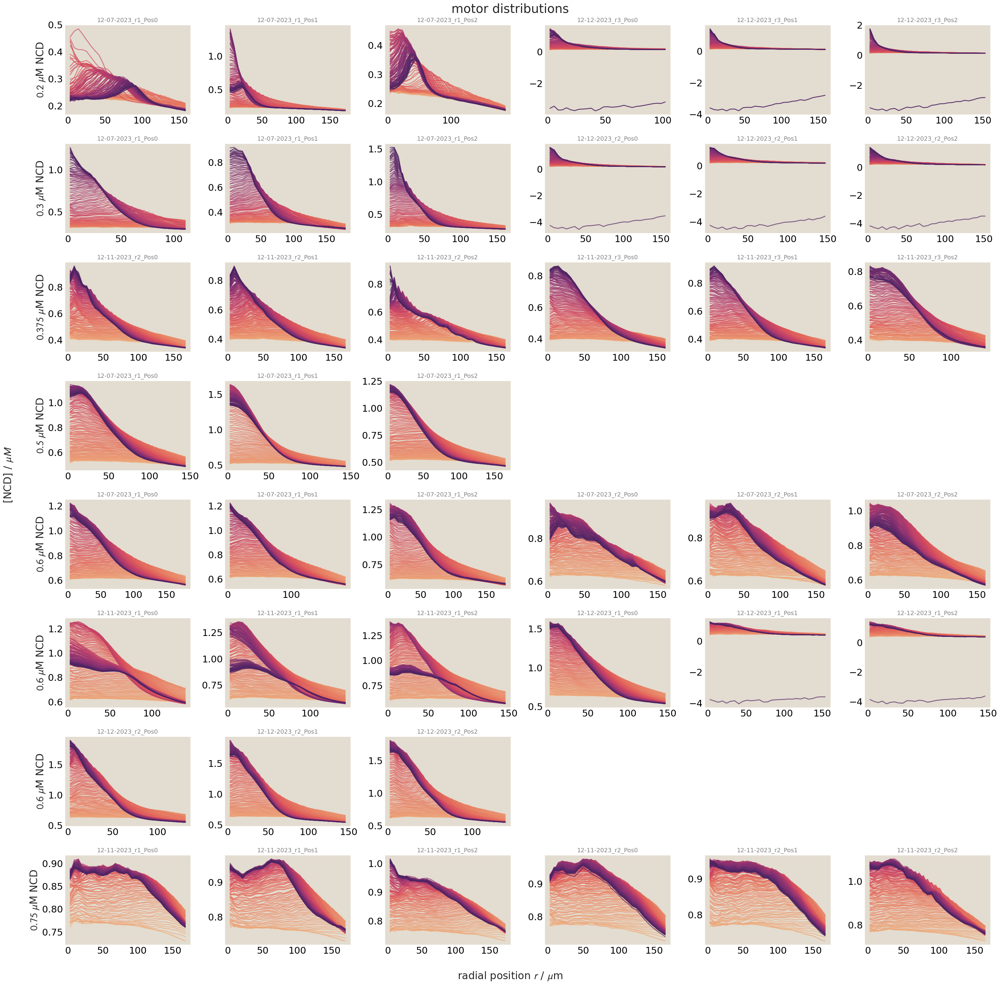

In [163]:
### MOTORS
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32))
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        rMotmids=h5dic['all_rMotbins']*umperpixel
        rMotavgs=h5dic['all_rMotavgs']
        for time in range(rMotmids.shape[0]):
            axs[rowCounter, colCounter].plot(rMotmids[time,:],
                                   rMotavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/rMotmids.shape[0]), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('motor distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)


# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241117_initialMultipleAster_smlMltpls_crrctGrid_Motors.pdf', bbox_inches='tight')

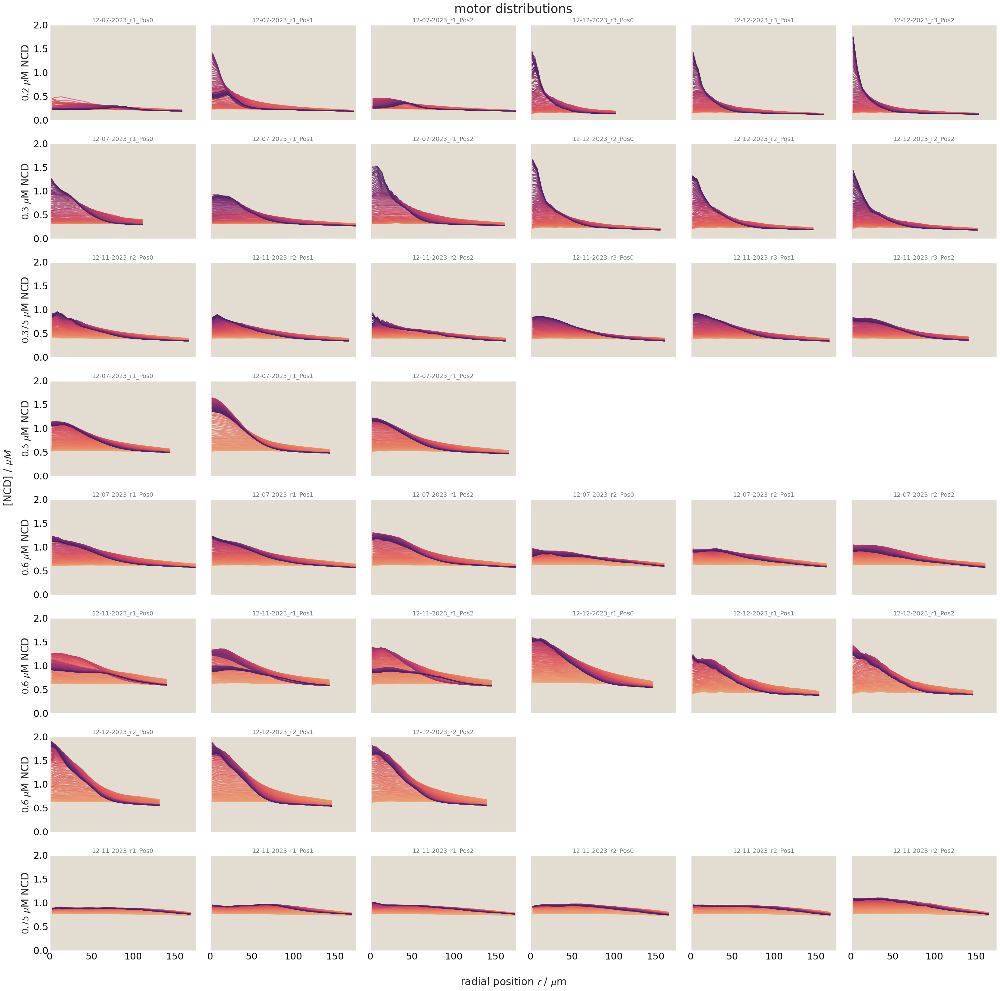

In [164]:
### MOTORS - fixed axes limits
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32), sharex=True, sharey=True)
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        rMotmids=h5dic['all_rMotbins']*umperpixel
        rMotavgs=h5dic['all_rMotavgs']
        for time in range(rMotmids.shape[0]):
            axs[rowCounter, colCounter].plot(rMotmids[time,:],
                                   rMotavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/rMotmids.shape[0]), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('motor distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)

### sensible global axis limits for motor
axs[0,0].set_ylim([-0.01, 2])
axs[0,0].set_xlim([-0.01, 175])

# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241117_initialMultipleAster_smlMltpls_crrctGrid_Motors_fixedAxLims.pdf', bbox_inches='tight')

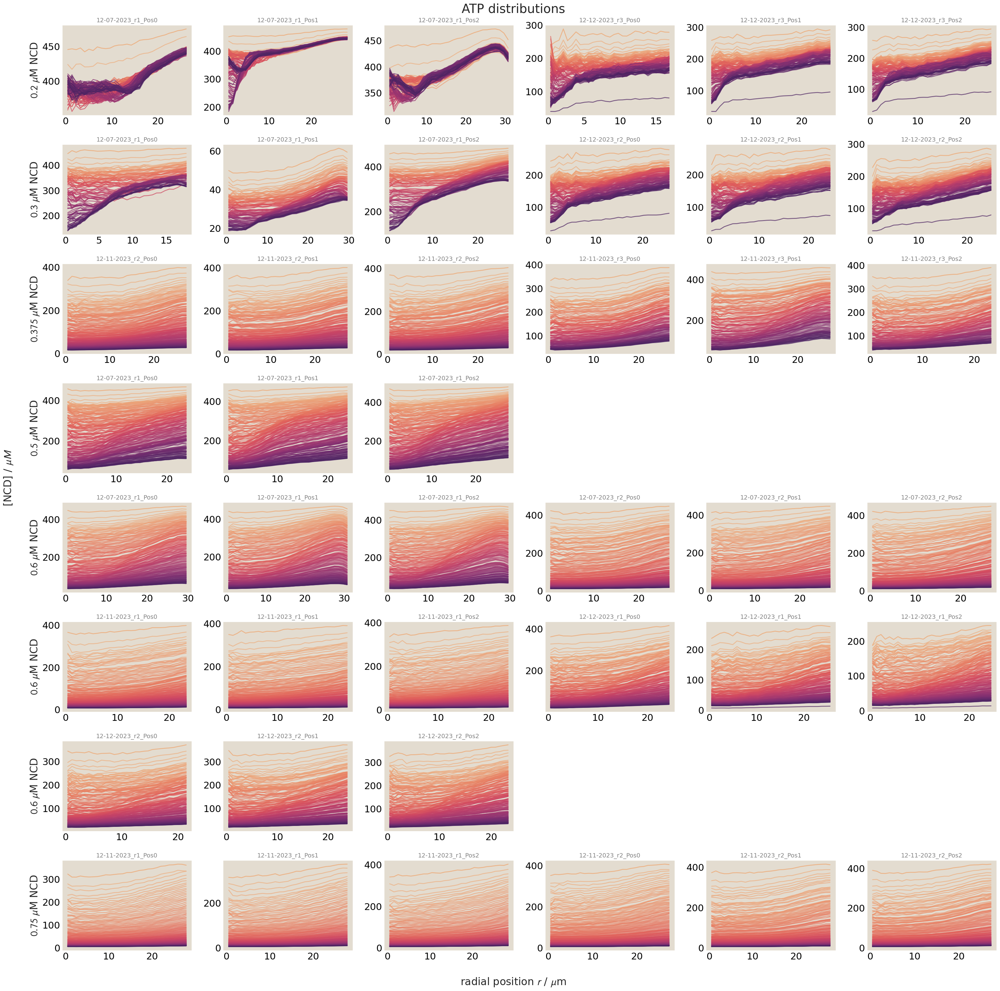

In [165]:
### ATP
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32))
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        rATPmids=h5dic['all_rATPbins']*umperpixel
        rATPavgs=h5dic['all_rATPavgs']
        for time in range(rATPmids.shape[0]):
            axs[rowCounter, colCounter].plot(rATPmids[time,:],
                                   rATPavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/rATPmids.shape[0]), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('ATP distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)


# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241117_initialMultipleAster_smlMltpls_crrctGrid_ATP.pdf', bbox_inches='tight')

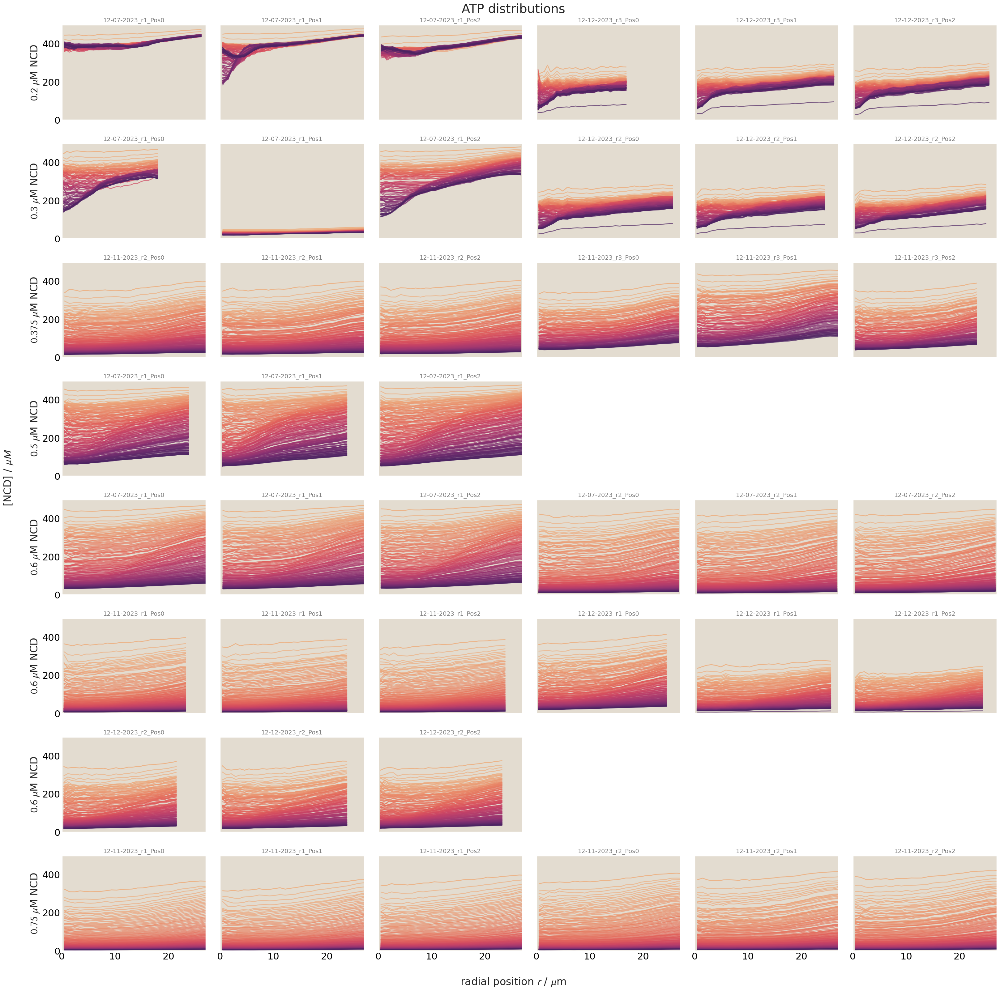

In [168]:
### ATP fixed axes limits
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32), sharex=True, sharey=True)
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        rATPmids=h5dic['all_rATPbins']*umperpixel
        rATPavgs=h5dic['all_rATPavgs']
        for time in range(rATPmids.shape[0]):
            axs[rowCounter, colCounter].plot(rATPmids[time,:],
                                   rATPavgs[time,:], alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/rATPmids.shape[0]), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('ATP distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)

axs[0,0].set_ylim([-0.01, 500])
axs[0,0].set_xlim([-0.01, 27])

# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241117_initialMultipleAster_smlMltpls_crrctGrid_ATP_fixedAxesLimits.pdf', bbox_inches='tight')

## Aster radii over time

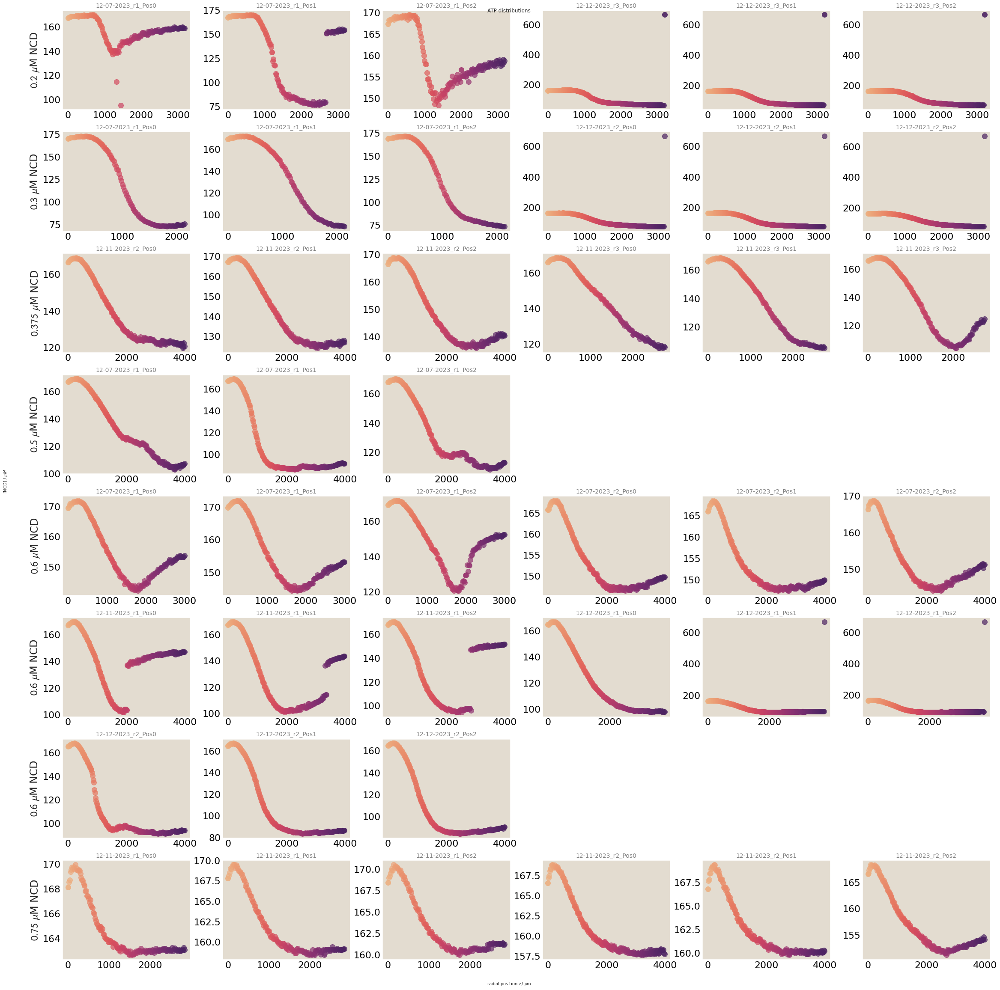

In [17]:
### aster raddii fixed axes limits
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32))#, sharex=True, sharey=True)
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        asterRadii=h5dic['radii']*umperpixel
        times=np.arange(len(asterRadii))*20; #20 seconds interval
        
        for time in range(len(times)):
            axs[rowCounter, colCounter].plot(times[time],
                                   asterRadii[time], 'o', alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/len(times)), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('ATP distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)

# axs[0,0].set_ylim([-0.01, 500])
# axs[0,0].set_xlim([-0.01, 27])

# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241118_initialMultipleAster_smlMltpls_crrctGrid_asterRadii_fixedAxesLimits.pdf', bbox_inches='tight')

In [ ]:
### aster raddii fixed axes limits
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32))#, sharex=True, sharey=True)
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        asterRadii=h5dic['radii']*umperpixel
        times=np.arange(len(asterRadii))*20; #20 seconds interval
        
        for time in range(len(times)):
            axs[rowCounter, colCounter].plot(times[time],
                                   asterRadii[time], 'o', alpha=0.7+((time%20)==0)*0.2, 
                                   color=sns.color_palette("flare", as_cmap=True)(time/len(times)), lw=2)        
        
        

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('ATP distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)

# axs[0,0].set_ylim([-0.01, 500])
# axs[0,0].set_xlim([-0.01, 27])

# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241118_initialMultipleAster_smlMltpls_crrctGrid_asterRadii_fixedAxesLimits.pdf', bbox_inches='tight')

## test

### Power versus time!

ValueError: x and y must have same first dimension, but have shapes (160,) and (158,)

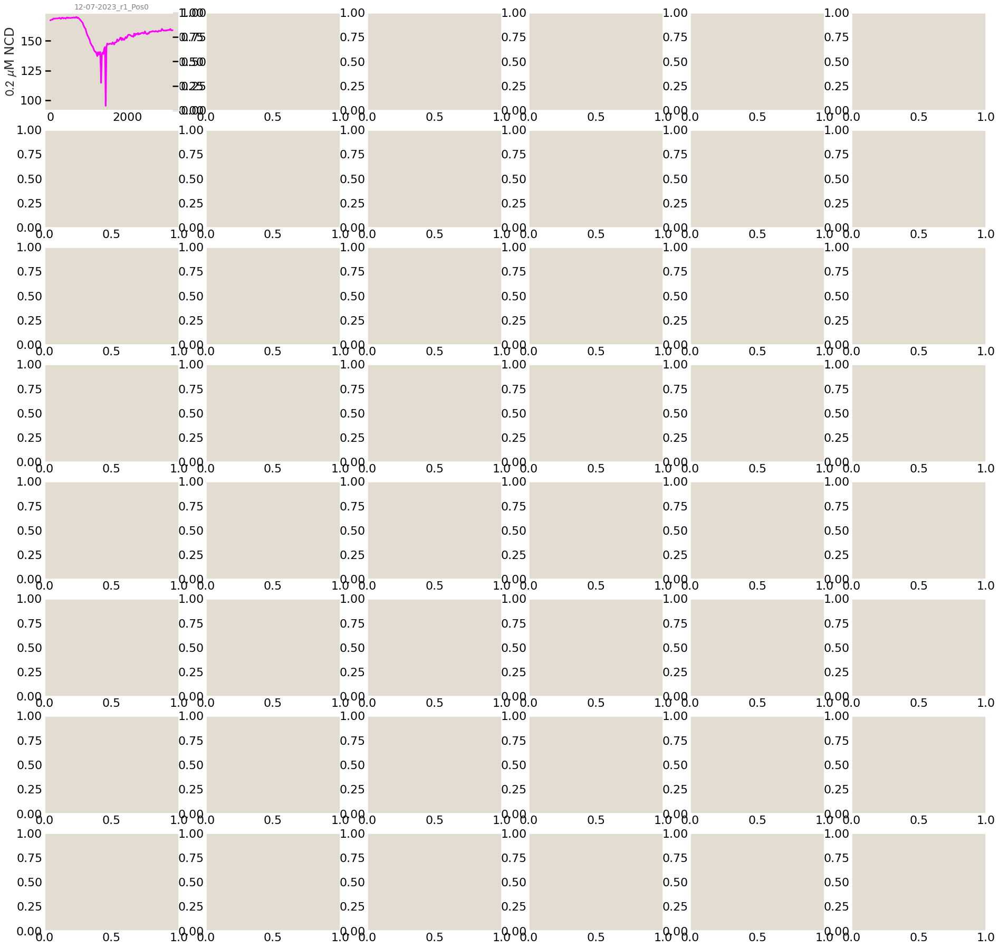

In [17]:
### aster raddii fixed axes limits
uniqueConcs = np.unique(allProps_verb[:, 1])
nrows, ncols = 8, 6  # Number of rows and columns in the subplot grid
fig, axs = plt.subplots(nrows=nrows, 
                        ncols=ncols,
                        figsize=(32, 32))#, sharex=True, sharey=True)
rowCounter = 0  # Initialize row counter
colCounter = 0  # Initialize column counter
# Iterate over unique concentrations
for ii in range(len(uniqueConcs)):
    c = uniqueConcs[ii]
    # Get indices for this concentration
    idxsForThisC = np.where(allProps_verb[:, 1] == c)[0]
    if colCounter==0:
        axs[rowCounter, colCounter].set_ylabel(r'$' + str(uniqueConcs[ii]) + r'\ \mu$M NCD')
    
    # Iterate over indices for this concentration
    for j in range(len(idxsForThisC)):
        # Check if we've exceeded the subplot grid
        if rowCounter >= nrows:
            print("Warning: Not enough subplots to display all data.")
            break  # Exit if no more subplots are available
            
        axs[rowCounter, colCounter].set_title(allProps_verb[idxsForThisC[j], 0], fontsize=14, color='grey')
        # Plot data
        #axs[rowCounter, colCounter].plot(1, 1, 'ro')
        ## get this gname's analyzed data files & parse
        #axs[thisSubplIdx].plot(1,1, 'ro')
        h5spath=gnameList[idxsForThisC[j]].split('data')[0]+'analyzed_data'+gnameList[idxsForThisC[j]].split('data')[1]+'/'
        h5dic = read_h5py(h5spath)
    
        # this is (numTimes, numRbinMidpoints)
        asterRadii=h5dic['radii']*umperpixel
        times=np.arange(len(asterRadii))*20; #20 seconds interval

        # also import power
        totalPowers=np.sum(h5dic['powerShells'], axis=1)
        times_power=h5dic['timesPower']
        
        # for time in range(len(times)):
        #     axs[rowCounter, colCounter].plot(times[time],
        #                            asterRadii[time], 'o', alpha=0.7+((time%20)==0)*0.2, 
        #                            color=sns.color_palette("flare", as_cmap=True)(time/len(times)), lw=2) 
        #     ## also plot apparent total power
        #     twin=axs[rowCounter, colCounter].twinx()
        #     twin.plot(times[time],
        #                            totalPowers[time], 'o-', alpha=0.7+((time%20)==0)*0.2, 
        #                            color=sns.color_palette("crest", as_cmap=True)(time/len(times)), lw=2)
        
        axs[rowCounter, colCounter].plot(times, asterRadii, '-', color='magenta', label='radius')
        twin=axs[rowCounter, colCounter].twinx()
        twin.plot(times_power, totalPowers, '--', color='blue', label='power')

        
        
        # Move to the next column
        colCounter += 1
        # If we've reached the end of the columns, reset colCounter and increment rowCounter
        if colCounter >= ncols:
            colCounter = 0
            rowCounter += 1

    # After processing this concentration, move to the next row if not already at the start of a new row
    if colCounter != 0:
        colCounter = 0
        rowCounter += 1


# [r'$' + str(c) + r'\ \mu$M NCD' for c in uniqueConcs]
# hack for labeling
axs[5,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');
axs[6,0].set_ylabel(r'$' + str(uniqueConcs[4]) + r'\ \mu$M NCD');

# Iterate through all subplots to hide empty ones
for ax in axs.flat:  # .flat iterates over all subplots in the grid
    if not ax.has_data():  # Check if the subplot has any data
        ax.set_visible(False)  # Hide the entire axis

plt.suptitle('ATP distributions')
# Add a common x-label
fig.text(0.5, -0.01, 'radial position $r$ / $\mu$m', ha='center', va='center')
# Add a common y-label
fig.text(-0.01, 0.5, '[NCD] / $\mu M$', ha='center', va='center', rotation=90)

# axs[0,0].set_ylim([-0.01, 500])
# axs[0,0].set_xlim([-0.01, 27])

# Adjust layout and display the plot
plt.tight_layout()

plt.savefig('20241118_initialMultipleAster_smlMltpls_crrctGrid_power_asterRadii_fixedAxesLimits.pdf', bbox_inches='tight')

### Visualizations, pending:
 * Radii versus time,
 * Total Power versus time,
 * power at radial position (per radial shell)
 * power per motor

Summaries:
* 
    
